In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.4 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.

In [21]:
import matplotlib.pyplot as plt
from matplotlib import animation, rc
rc('animation', html = 'jshtml')
import cv2
import os
import numpy as np
from PIL import Image

In [18]:
def create_animation(dir_path):
  image_files = [f for f in os.listdir(dir_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
  ims = [cv2.imread(os.path.join(dir_path, file)) for file in image_files]

  fig = plt.figure(figsize=(7,4))
  im = plt.imshow(cv2.cvtColor(ims[0], cv2.COLOR_BGR2RGB))
  plt.close()

  def animate_func(i):
    im.set_array(cv2.cvtColor(ims[i], cv2.COLOR_BGR2RGB))
    return[im]

  return animation.FuncAnimation(fig, animate_func, frames=len(ims), interval = 100//2)

In [19]:
result = create_animation('/content/drive/MyDrive/PrivateProjects/P11YOLO/test_images')
result

#Creating Train-Val Split

In [1]:
import os
import shutil
import random

!pip install tqdm --upgrade
from tqdm.notebook import tqdm

In [ ]:
train_path_img = "./yolo_data/images/train/"
train_path_label = "./yolo_data/labels/train/"
val_path_img = "./yolo_data/images/val/"
val_path_label = "./yolo_data/labels/val/"
test_path = "./yolo_data/test"

In [ ]:
def train_test_split(path, neg_path=None, split=0.2):
  print('-----PROCESS STARTED-----')

  files = list(set([name[:-4] for name in os.listdir(path)])) #removing duplicate names i.e. counting only number of images

  print(f'--- This folder has a total number of {len(files)} images ---')
  random.seed(42)
  random.shuffle(files)

  test_size = int(len(files) * split)
  train_size = len(files) - test_size

  # Creating required directories

  os.makedirs(train_path_img, exist_ok = True)
  os.makedirs(train_path_label, exist_ok = True)
  os.makedirs(val_path_img, exist_ok = True)
  os.makedirs(val_path_label, exist_ok = True)

  # Copying images to train folder

  for filex in tqdm(files[:train_size]):
    if filex == 'classes':
        continue
    shutil.copy2(path + '/' + filex + '.jpg', f"{train_path_img}/" + filex + '.jpg')
    shutil.copy2(path + '/' + filex + '.txt', f"{train_path_label}/" + filex + '.txt')

    print(f'-----Training data created with 80% split {len(files[:train_size])} images -----')

  if neg_path:
    neg_images = list(set([name[:-4] for name in os.listdir(neg_path)])) #removing the duplicate
    for filex in tqdm(neg_images):
      shutil.copy2(neg_path + '/' + filex + '.jpg', f'{train_path_img}/' + filex + '.jpg')

    print(f"------ Total  {len(neg_images)} negative images added to the training data -------")

    print(f"------ TOTAL Training data created with {len(files[:train_size]) + len(neg_images)} images -------")



      #copying to val

  for filex in tqdm(files[train_size:]):
    if filex == 'classes':
        continue
    shutil.copy2(path + '/' + filex + '.jpg', f"{val_path_img}/" + filex + '.jpg')
    shutil.copy2(path + '/' + filex + '.txt', f"{val_path_label}/" + filex + '.txt')

    print(f"------ Testing data created with a total of {len(files[train_size:])} images ----------")

    print("------ TASK COMPLETED -------")


train_test_split('/content/drive/MyDrive/PrivateProjects/P11 - YOLO/data')

-----PROCESS STARTED-----
--- This folder has a total number of 66 images ---


  0%|          | 0/53 [00:00<?, ?it/s]

-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training data created with 80% split 53 images -----
-----Training 

  0%|          | 0/13 [00:00<?, ?it/s]

------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 images ----------
------ TASK COMPLETED -------
------ Testing data created with a total of 13 ima

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 33.8/78.2 GB disk)


#Traning

In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data=/content/drive/MyDrive/PrivateProjects/P11YOLO/dataset.yaml epochs=10 imgsz=640 batch=8 project=/content/drive/MyDrive/PrivateProjects/P11YOLO/training_results name=football

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/drive/MyDrive/PrivateProjects/P11YOLO/dataset.yaml, epochs=10, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/PrivateProjects/P11YOLO/training_results, name=football, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=Fa

#Results of Training

In [20]:
tpaths=[]
for dirname, _, filenames in os.walk('/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2'):
  for filename in filenames:
    if filename[-4:]=='.png' or filename[-4:]=='.jpg':
      tpaths+=[(os.path.join(dirname, filename))]
      tpaths=sorted(tpaths)
      print(tpaths[0])

/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels_correlogram.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_results/football2/labels.jpg
/content/drive/MyDrive/PrivateProjects/P11YOLO/yolov8/training_resul

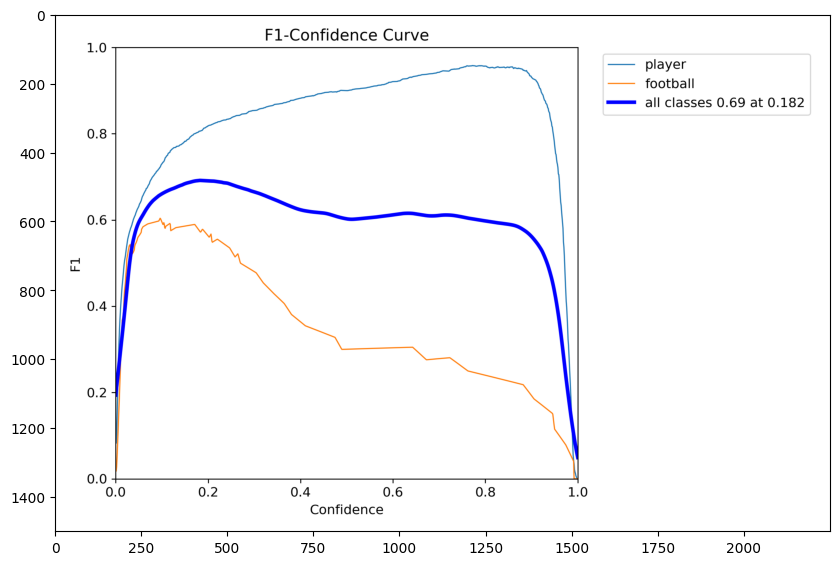

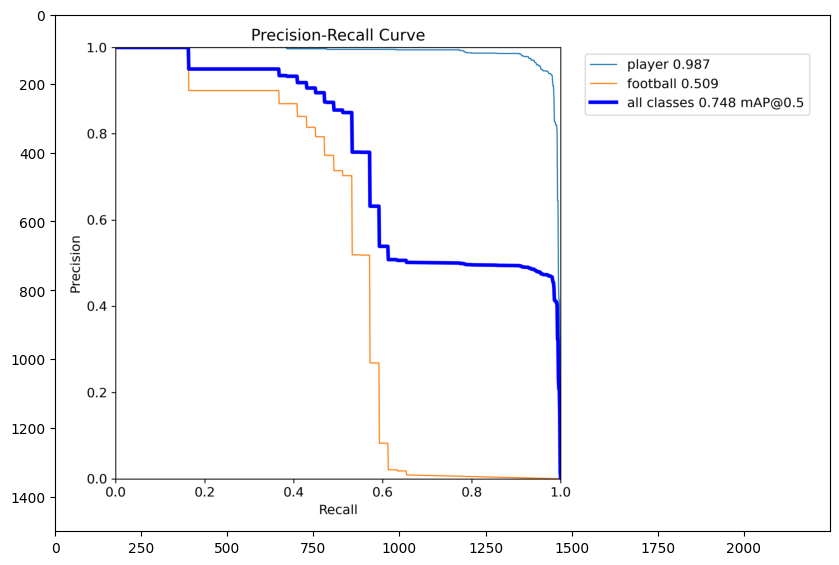

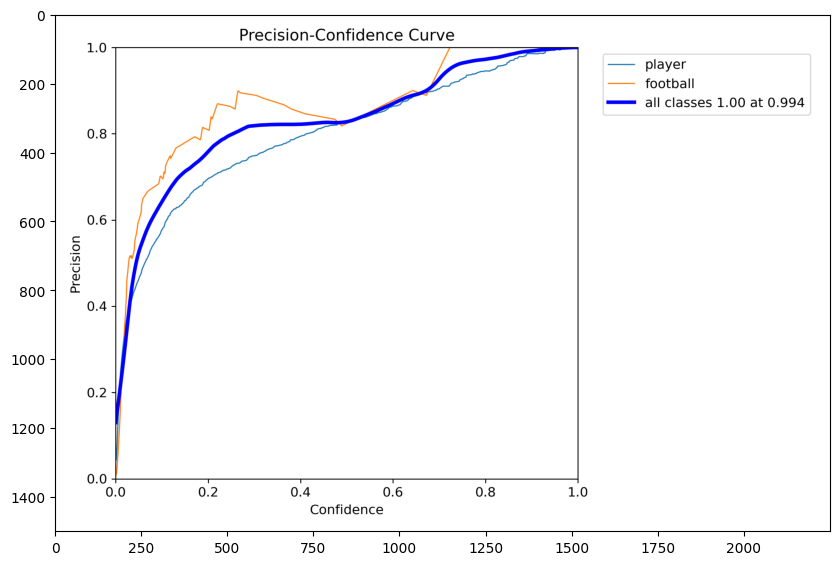

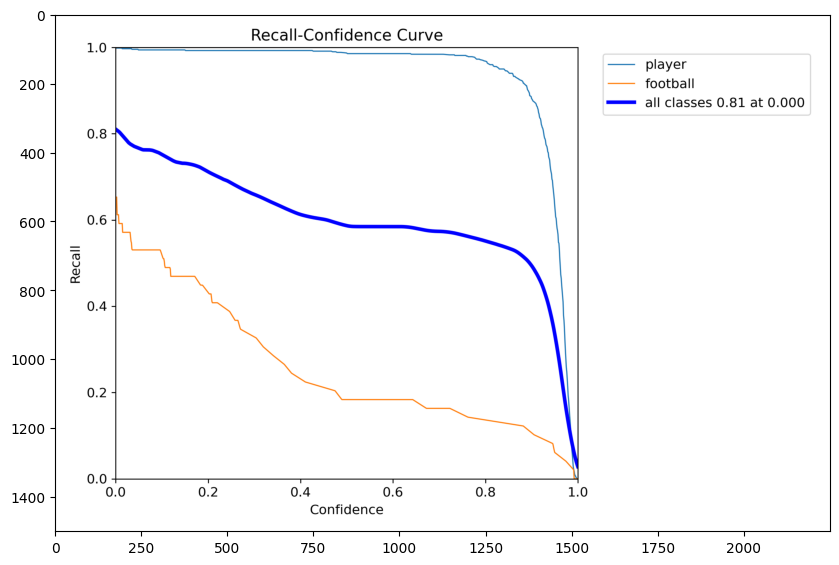

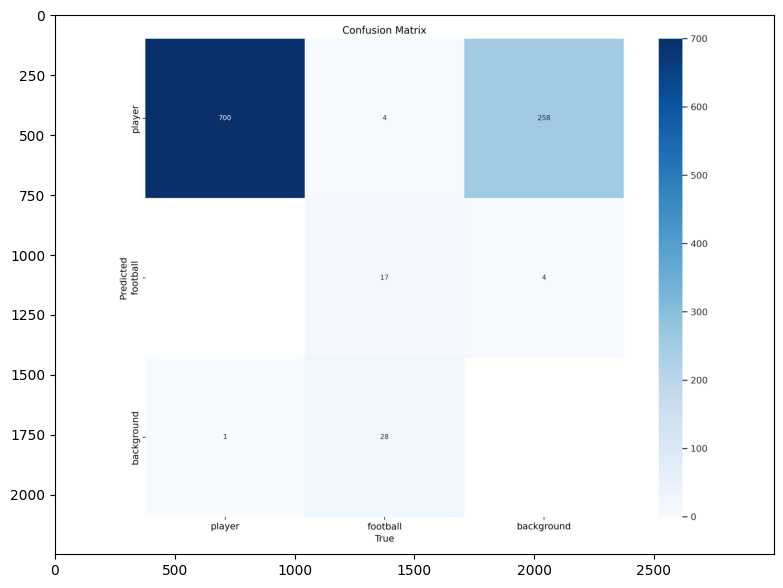

...

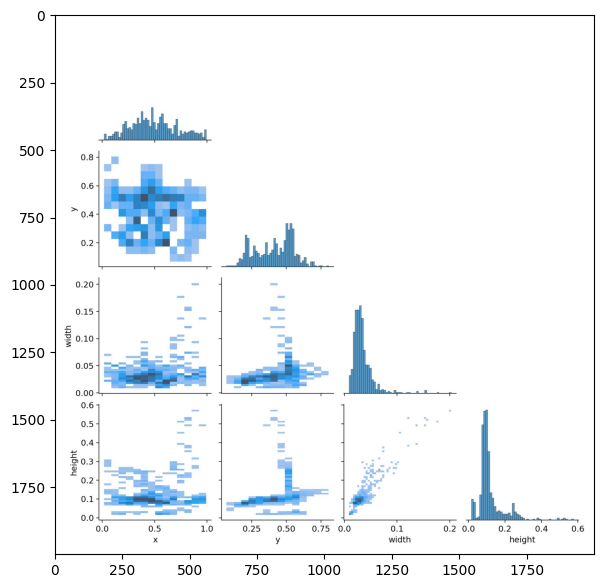

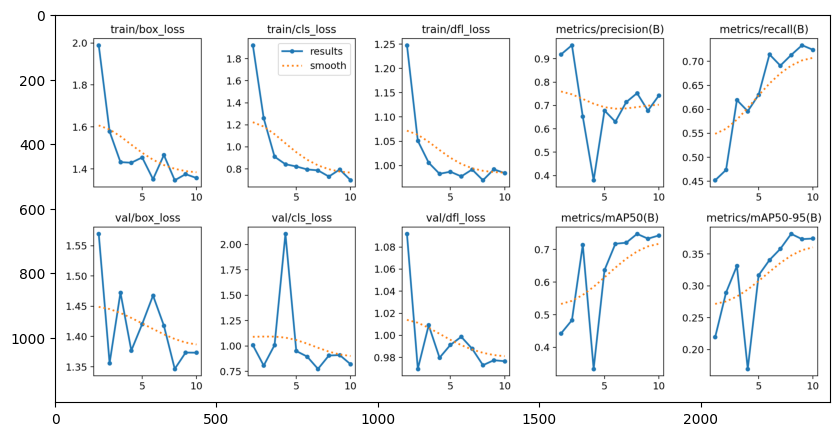

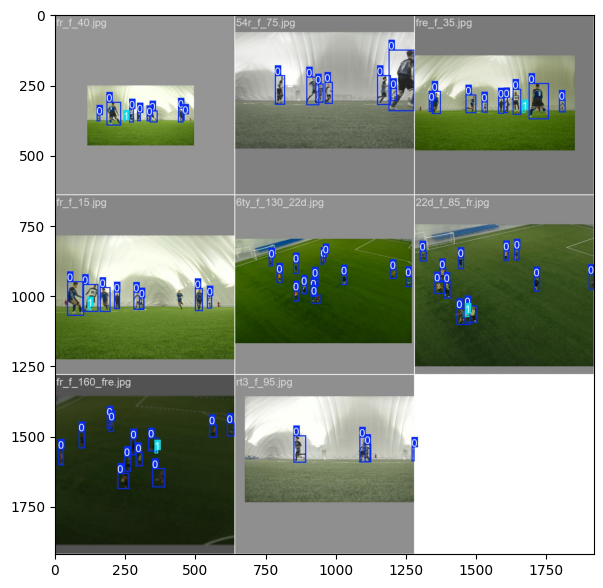

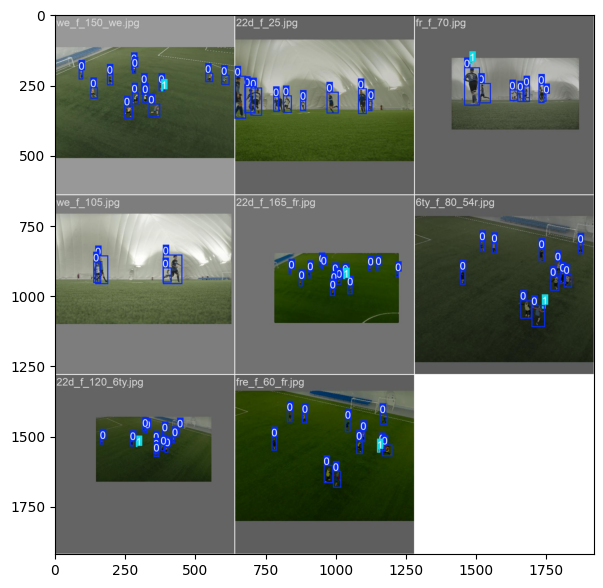

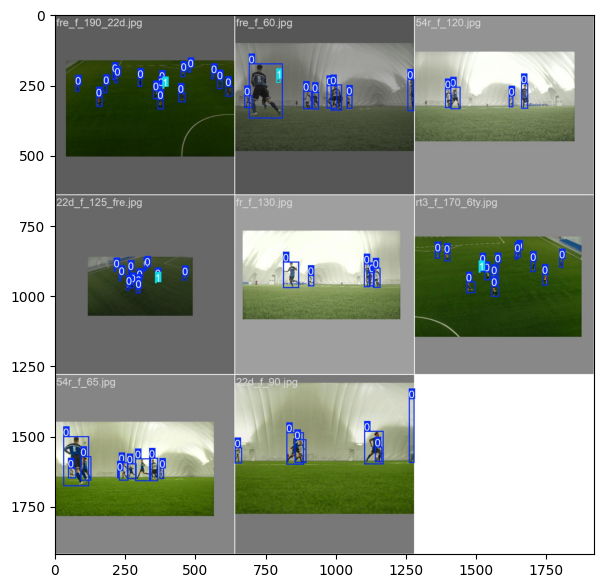

/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


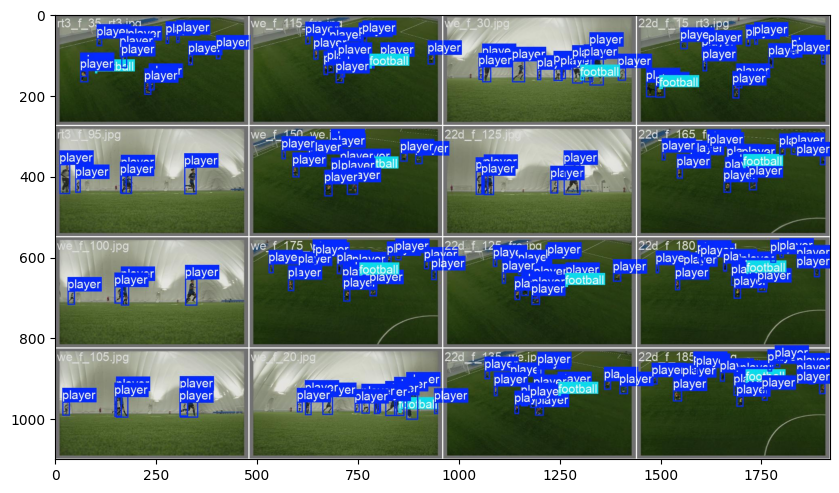

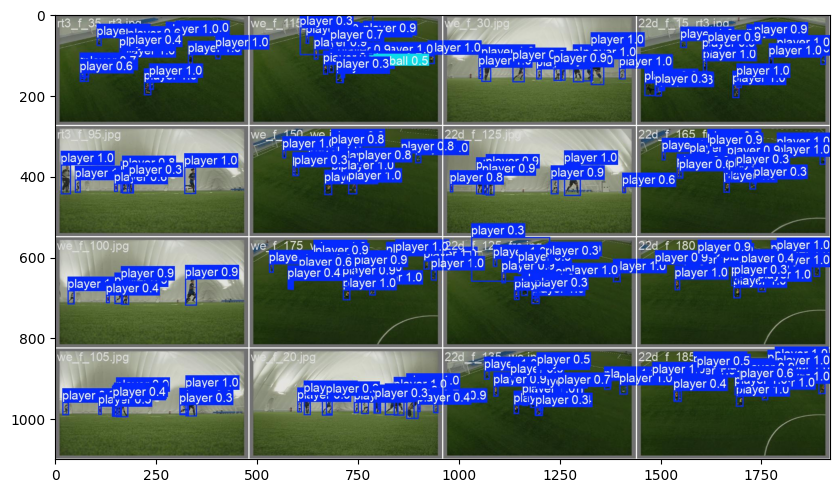

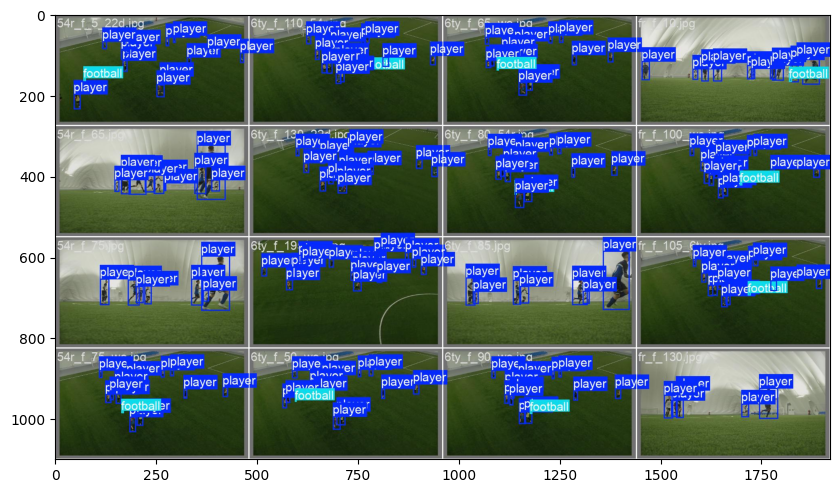

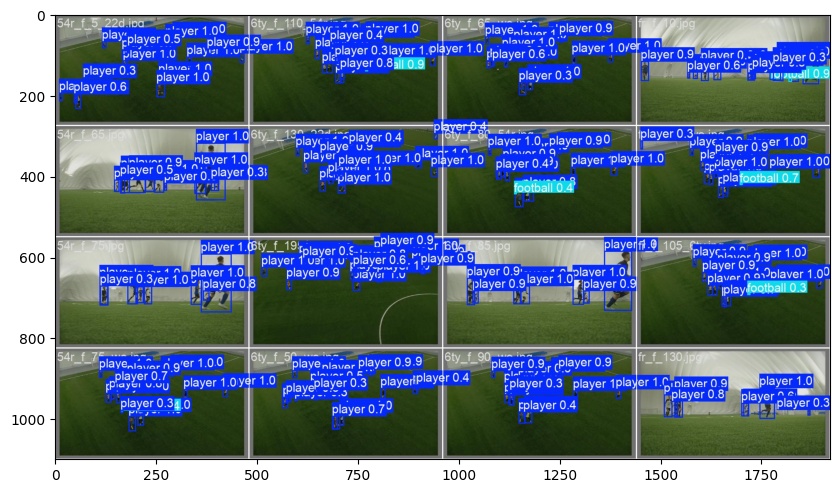

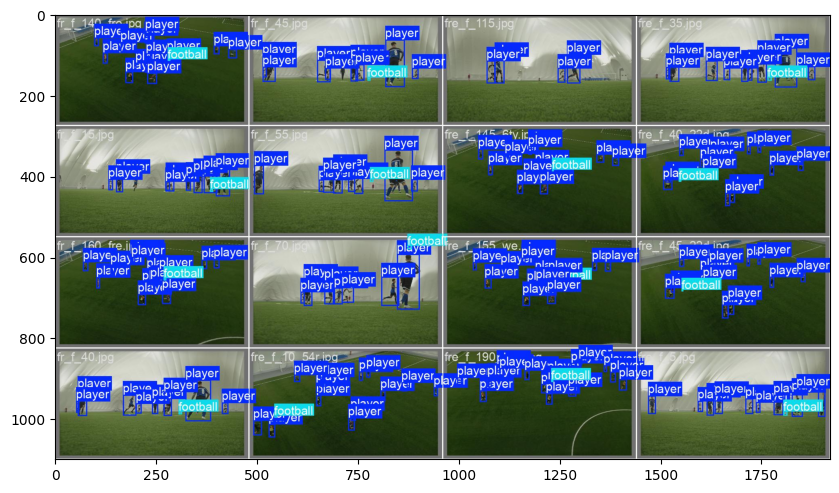

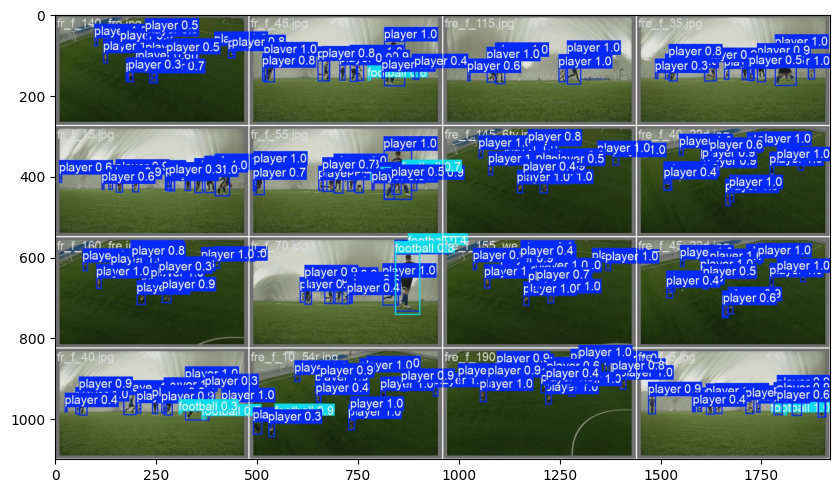

In [23]:
for path in tpaths:
  image = Image.open(path)
  image=np.array(image)
  plt.figure(figsize=(10, 7))
  plt.imshow(image)
  plt.show()

#Predicting

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/PrivateProjects/P11YOLO/training_results/football/weights/best.pt conf=0.55 source=/content/drive/MyDrive/PrivateProjects/P11YOLO/test_images

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs

image 1/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/22d_f_125.jpg: 384x640 6 players, 104.9ms
image 2/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/22d_f_200_rt3.jpg: 384x640 16 players, 10.7ms
image 3/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/22d_f_85_fr.jpg: 384x640 13 players, 10.7ms
image 4/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/54r_f_75_we.jpg: 384x640 13 players, 1 football, 10.7ms
image 5/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/fr_f_140_fre.jpg: 384x640 18 players, 10.7ms
image 6/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/fr_f_40.jpg: 384x640 9 players, 1 football, 10.7ms
image 7/9 /content/drive/MyDrive/PrivateProjects/P11YOLO/test_images/fre_f_115.jpg: 384x640 4 players, 10.7ms
image 8/9 /content/dr

In [ ]:
!cp -r /content/runs/detect/predict /content/drive/MyDrive/PrivateProjects/P11YOLO/output

In [24]:
create_animation('/content/drive/MyDrive/PrivateProjects/P11YOLO/output/predict')

#Predicting on Video

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/PrivateProjects/P11YOLO/training_results/football/weights/best.pt conf=0.77 source=/content/drive/MyDrive/PrivateProjects/P11YOLO/vid2

Ultralytics YOLOv8.2.77 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs

video 1/3 (frame 1/942) /content/drive/MyDrive/PrivateProjects/P11YOLO/vid2/3507660-uhd_3840_2160_30fps.mp4: 384x640 28 players, 70.0ms
video 1/3 (frame 2/942) /content/drive/MyDrive/PrivateProjects/P11YOLO/vid2/3507660-uhd_3840_2160_30fps.mp4: 384x640 26 players, 21.9ms
video 1/3 (frame 3/942) /content/drive/MyDrive/PrivateProjects/P11YOLO/vid2/3507660-uhd_3840_2160_30fps.mp4: 384x640 27 players, 11.8ms
video 1/3 (frame 4/942) /content/drive/MyDrive/PrivateProjects/P11YOLO/vid2/3507660-uhd_3840_2160_30fps.mp4: 384x640 25 players, 10.9ms
video 1/3 (frame 5/942) /content/drive/MyDrive/PrivateProjects/P11YOLO/vid2/3507660-uhd_3840_2160_30fps.mp4: 384x640 25 players, 13.4ms
video 1/3 (frame 6/942) /content/drive/MyDrive/PrivateProjects/P11YOLO/vid2/3507660-uhd_3840_2160_30fps.mp4: 384x640 25 players, 10.9ms
video 1/3 (fr

In [ ]:
!cp -r /content/runs/detect/predict2 /content/drive/MyDrive/PrivateProjects/P11YOLO/output